In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
from astropy.io import fits
import sys
from helita.io import lp
from scipy.io.idl import readsav
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib as mpl
from matplotlib import cm
import sunpy.cm as cmaps
from sklearn.impute import SimpleImputer
import h5py
from matplotlib.path import Path
from matplotlib.image import NonUniformImage
from tqdm import tqdm
import cmasher as cmr
from matplotlib.path import Path
import matplotlib.colors as colors

In [2]:
dpath_energy = '/mn/stornext/d9/souvikb/High_impact/'
dpath_simulation ='/mn/stornext/d5/juanms/mpi3druns/2Druns/genohm/rain/l2d90x40rvk/sim_data_rh_it=280-369.hdf5'

In [3]:
energy = h5py.File(dpath_energy+'spicule_energy_it=280-369.hdf5', 'r')
e = energy['e']
input_sim = h5py.File(dpath_simulation,'r')
temp_juan=input_sim['temperature']
vel_juan=input_sim['velocity_z']
z    = input_sim['z']#Height (m)
x    = input_sim['x']#Spatial [m]
y    = input_sim['y']# time []

In [4]:
#Reading the X (Mm), Z (Mm) and Y (sec) information from the simulation
z1 = z[0,:]/1e6
x_extent = x[4320:5759]/1e6
#extend = (x1.min(),x1.max(),z1.max(),z1.min())
x2 = y[:]*10 -y[0]*10
extend1 = (x2.min(),x2.max(),z1.max(),z1.min())
# x_pos1=4865-4176
# x_pos2=4980-4176

In [5]:
#Heating terms
Q = h5py.File(dpath_energy+'spicule_qterms_it=280-369.hdf5','r')
Qjamb = Q['qjamb']
Qgenrad =Q['qgenrad']
Qjoule = Q['qjoule']
Qpdv =Q['qpdv']
Qspitz=Q['qspitz']
Qvisc =Q['qvisc']

In [120]:
#Charactertistic times
x_slice =[4320,5759]
y_slice =[500,1410]
tau_qjamb = np.zeros((x_slice[1]-x_slice[0],y_slice[1]-y_slice[0],50))
tau_qjoule = tau_qjamb*0.
tau_visc = tau_qjamb*0.
tau_spitz = tau_qjamb*0.
tau_genrad = tau_qjamb*0.
for scan in tqdm(range(50)):  
    tau_qjamb[:,:,scan] = 1e2*(np.array(e[4320:5759,scan,500:1410])/(1e-20+np.array(np.abs(Qjamb[4320:5759,scan,500:1410]))))
    tau_qjoule[:,:,scan] =1e2*(np.array(e[4320:5759,scan,500:1410])/(1e-20+np.array(np.abs(Qjoule[4320:5759,scan,500:1410]))))
    tau_visc[:,:,scan] = 1e2*(np.array(e[4320:5759,scan,500:1410])/(1e-20+np.array(np.abs(Qvisc[4320:5759,scan,500:1410]))))
    tau_spitz[:,:,scan] = 1e2*(np.array(e[4320:5759,scan,500:1410])/(1e-20+np.array(np.abs(Qspitz[4320:5759,scan,500:1410]))))
    tau_genrad[:,:,scan] = 1e2*(np.array(e[4320:5759,scan,500:1410])/(1e-20+np.array(np.abs(Qgenrad[4320:5759,scan,500:1410]))))

100%|██████████| 50/50 [10:23<00:00, 12.46s/it]


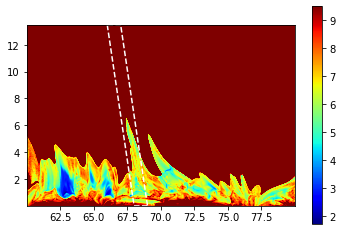

In [46]:
point1 = [68.0,0.006]# same ROI
point2 = [69.0,0.006]
point3 = [67.0,13.49]
point4 = [66.0,13.49]
x_values1 = [point1[0], point2[0]]
y_values1 = [point1[1], point2[1]]

x_values2 =[point2[0],point3[0]]
y_values2 = [point2[1],point3[1]]

x_values3 =[point3[0],point4[0]]
y_values3 = [point3[1],point4[1]]

x_values4 = [point4[0],point1[0]]
y_values4 = [point4[1],point1[1]]
plt.imshow(np.log10(np.abs(tau_qjamb.T)),cmap='jet',vmax=9.5,extent=[x_extent[0],x_extent[-1],z1[1410],z1[500]])
plt.colorbar()
plt.plot(x_values1, y_values1,linestyle='--',color='white')
plt.plot(x_values2, y_values2,linestyle='--',color='white')
plt.plot(x_values3, y_values3,linestyle='--',color='white')
plt.plot(x_values4, y_values4,linestyle='--',color='white')

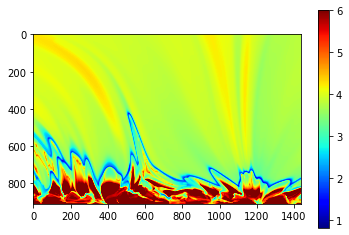

In [47]:
plt.imshow(np.log10(np.abs(tau_qgenrad.T)),cmap='jet',vmax=6)
plt.colorbar()

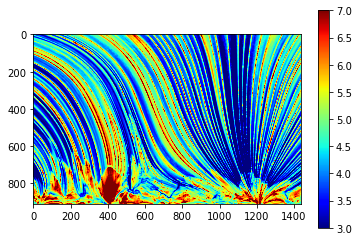

In [53]:
plt.imshow(np.log10(np.abs(tau_joule.T)),cmap='jet',vmax=7,vmin=3)
plt.colorbar()

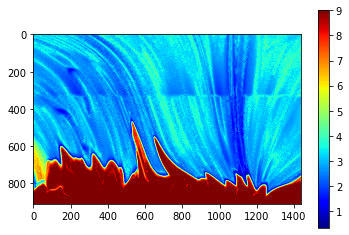

In [49]:
plt.imshow(np.log10(np.abs(tau_spitz.T)),cmap='jet',vmax=9)
plt.colorbar()

In [39]:
x_slice =[4320,5759]
y_slice =[500,1410]
roi_spicule_Qjamb_tau = np.zeros((x_slice[1]-x_slice[0],y_slice[1]-y_slice[0],50))
roi_spicule_Qjoule_tau = roi_spicule_Qjamb_tau*0.
roi_spicule_Qvisc_tau = roi_spicule_Qjamb_tau*0.
roi_spicule_Qspitz_tau = roi_spicule_Qjamb_tau*0.
roi_spicule_Qgenrad_tau = roi_spicule_Qjamb_tau*0.
for scan in tqdm(range(50)):
    nx, ny = 910, 1439
    poly_verts =[(910,645), (910,573), (0,429), (0,501)]
    x, y = np.meshgrid(np.arange(nx), np.arange(ny))
    x, y = x.flatten(), y.flatten()
    points = np.vstack((x,y)).T
    path = Path(poly_verts)
    grid = path.contains_points(points)
    grid = np.array(grid.reshape((ny,nx)))
    
    roi_spicule_Qjamb_tau[:,:,scan] = grid*1e2*(np.array(e[4320:5759,scan,500:1410])/(1e-20+np.array(np.abs(Qjamb[4320:5759,scan,500:1410]))))
    roi_spicule_Qjoule_tau[:,:,scan] = grid*1e2*(np.array(e[4320:5759,scan,500:1410])/(1e-20+np.array(np.abs(Qjoule[4320:5759,scan,500:1410]))))
    roi_spicule_Qvisc_tau[:,:,scan] = grid*1e2*(np.array(e[4320:5759,scan,500:1410])/(1e-20+np.array(np.abs(Qvisc[4320:5759,scan,500:1410]))))
    roi_spicule_Qspitz_tau[:,:,scan] = grid*1e2*(np.array(e[4320:5759,scan,500:1410])/(1e-20+np.array(np.abs(Qspitz[4320:5759,scan,500:1410]))))
    roi_spicule_Qgenrad_tau[:,:,scan] = grid*1e2*(np.array(e[4320:5759,scan,500:1410])/(1e-20+np.array(np.abs(Qgenrad[4320:5759,scan,500:1410]))))

100%|██████████| 50/50 [09:25<00:00, 11.30s/it]


In [32]:
np.min(Qspitz)

-0.0032674618996679783

In [54]:
tau_qjamb_xt_slit = np.mean(roi_spicule_Qjamb_tau,axis=0)
tau_qjoule_xt_slit = np.mean(roi_spicule_Qjoule_tau,axis=0)
tau_qvisc_xt_slit = np.mean(roi_spicule_Qvisc_tau,axis=0)
tau_qspitz_xt_slit = np.mean(roi_spicule_Qspitz_tau,axis=0)
tau_qgenrad_xt_slit = np.mean(roi_spicule_Qgenrad_tau,axis=0)

<ipython-input-172-15564b50609b>:1: RuntimeWarning: divide by zero encountered in log10
  plt.imshow(np.log10(tau_qjamb_xt_slit[:,:]),aspect=0.05, cmap='jet',norm=colors.PowerNorm(gamma=0.8),vmax=16)
<ipython-input-172-15564b50609b>:1: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  plt.imshow(np.log10(tau_qjamb_xt_slit[:,:]),aspect=0.05, cmap='jet',norm=colors.PowerNorm(gamma=0.8),vmax=16)


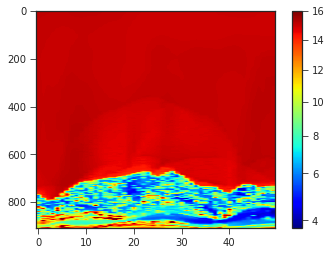

In [172]:
plt.imshow(np.log10(tau_qjamb_xt_slit[:,:]),aspect=0.05, cmap='jet',norm=colors.PowerNorm(gamma=0.8),vmax=16)
plt.colorbar()

<ipython-input-193-b7df2b70df06>:1: RuntimeWarning: divide by zero encountered in log10
  plt.imshow(np.log10(tau_qjoule_xt_slit[:,:]),aspect=0.05,cmap='jet',norm=colors.PowerNorm(gamma=1.),vmax=10,vmin=1)
<ipython-input-193-b7df2b70df06>:1: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  plt.imshow(np.log10(tau_qjoule_xt_slit[:,:]),aspect=0.05,cmap='jet',norm=colors.PowerNorm(gamma=1.),vmax=10,vmin=1)


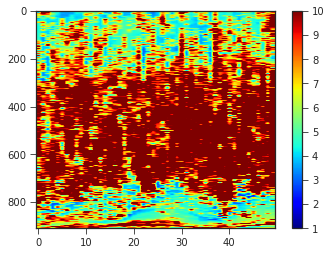

In [193]:
plt.imshow(np.log10(tau_qjoule_xt_slit[:,:]),aspect=0.05,cmap='jet',norm=colors.PowerNorm(gamma=1.),vmax=10)
plt.colorbar()

<ipython-input-100-e432726d53e9>:1: RuntimeWarning: divide by zero encountered in log10
  plt.imshow(np.log10(tau_qgenrad_xt_slit),aspect=0.05,cmap='jet',vmax=5,norm=colors.PowerNorm(gamma=1.2))
<ipython-input-100-e432726d53e9>:1: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  plt.imshow(np.log10(tau_qgenrad_xt_slit),aspect=0.05,cmap='jet',vmax=5,norm=colors.PowerNorm(gamma=1.2))


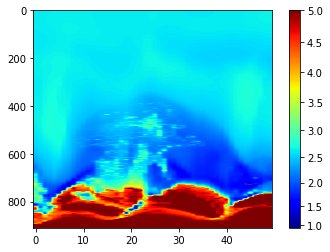

In [100]:
plt.imshow(np.log10(tau_qgenrad_xt_slit),aspect=0.05,cmap='jet',vmax=5,norm=colors.PowerNorm(gamma=1.2))
plt.colorbar()

<ipython-input-99-8d50d2f2bd70>:1: RuntimeWarning: divide by zero encountered in log10
  plt.imshow(np.log10(tau_qspitz_xt_slit/10),aspect=0.05,cmap='jet',vmax=10,vmin=0.5,norm=colors.PowerNorm(gamma=1.4))
<ipython-input-99-8d50d2f2bd70>:1: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  plt.imshow(np.log10(tau_qspitz_xt_slit/10),aspect=0.05,cmap='jet',vmax=10,vmin=0.5,norm=colors.PowerNorm(gamma=1.4))


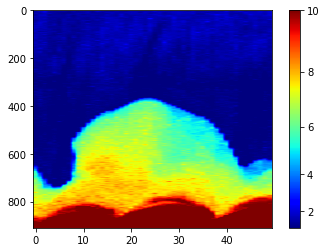

In [99]:
plt.imshow(np.log10(tau_qspitz_xt_slit/10),aspect=0.05,cmap='jet',vmax=10,vmin=0.5,norm=colors.PowerNorm(gamma=1.4))
plt.colorbar()

<ipython-input-139-8dc06109a95a>:1: RuntimeWarning: divide by zero encountered in log10
  plt.imshow(np.log10(tau_qvisc_xt_slit[:,:]),aspect=0.05,cmap='jet',vmax=4.9,vmin=1.1,norm=colors.PowerNorm(gamma=1.1))
<ipython-input-139-8dc06109a95a>:1: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  plt.imshow(np.log10(tau_qvisc_xt_slit[:,:]),aspect=0.05,cmap='jet',vmax=4.9,vmin=1.1,norm=colors.PowerNorm(gamma=1.1))


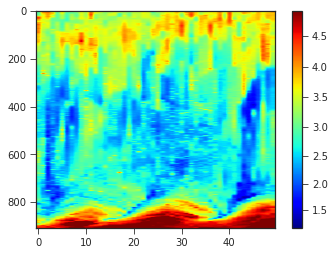

In [139]:
plt.imshow(np.log10(tau_qvisc_xt_slit[:,:]),aspect=0.05,cmap='jet',vmax=4.9,vmin=1.1,norm=colors.PowerNorm(gamma=1.1))
plt.colorbar()

  0%|          | 0/50 [00:00<?, ?it/s]<ipython-input-199-a6fedbaaf8bf>:7: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  axs[0].imshow(np.log10(np.abs(tau_genrad[:,:,scan].T)),cmap='jet',vmax=5,aspect='auto',norm=colors.PowerNorm(gamma=1.2),extent=[x_extent[0],x_extent[-1],z1[1410],z1[500]])
<ipython-input-199-a6fedbaaf8bf>:15: RuntimeWarning: divide by zero encountered in log10
  im3=axs[1].imshow(np.log10(tau_qgenrad_xt_slit),aspect='auto',cmap='jet',vmax=5,norm=colors.PowerNorm(gamma=1.2),extent=[x2[0],x2[50],z1[1410],z1[500]])
<ipython-input-199-a6fedbaaf8bf>:15: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  im3=axs[1].imshow(np.log10(tau_

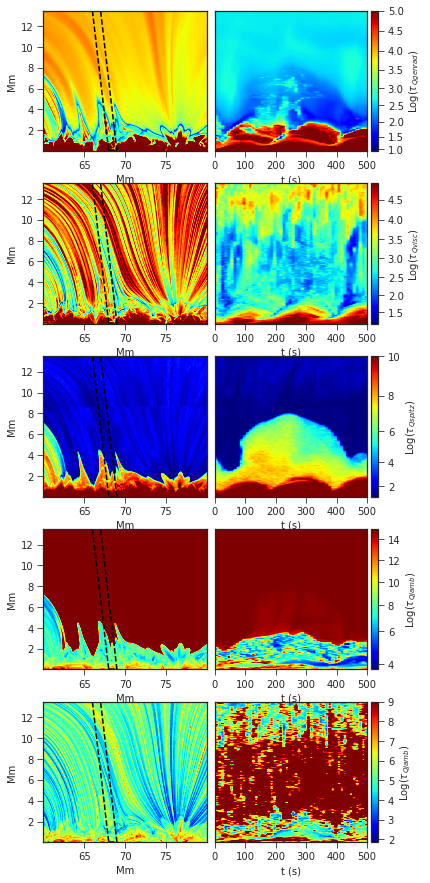

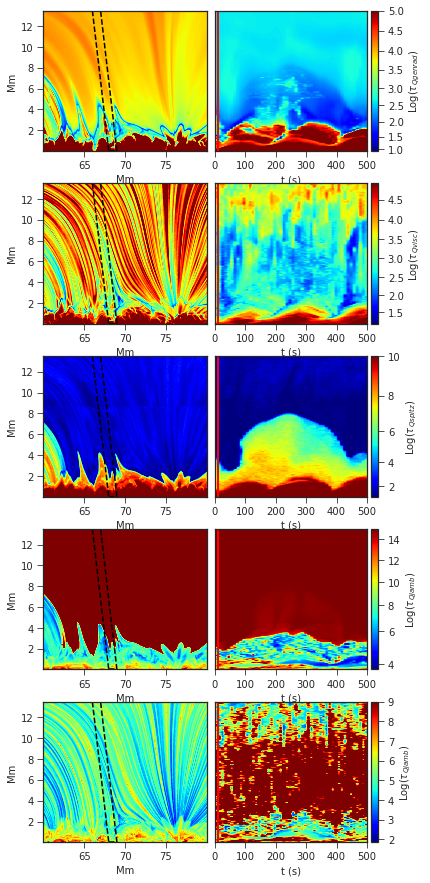

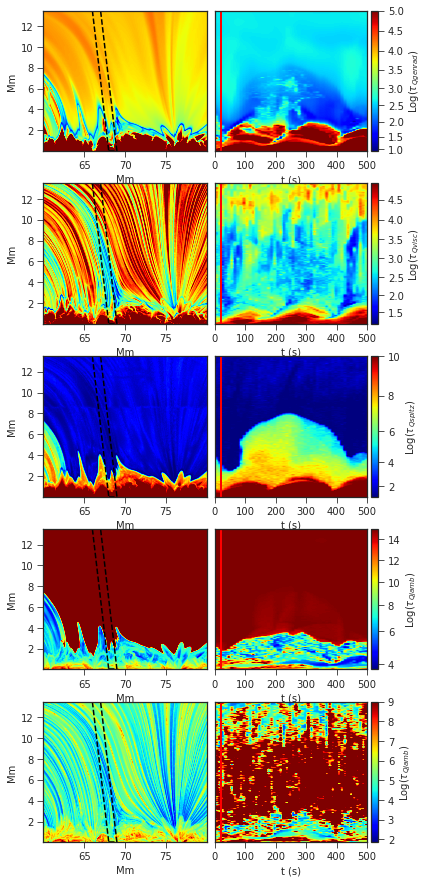

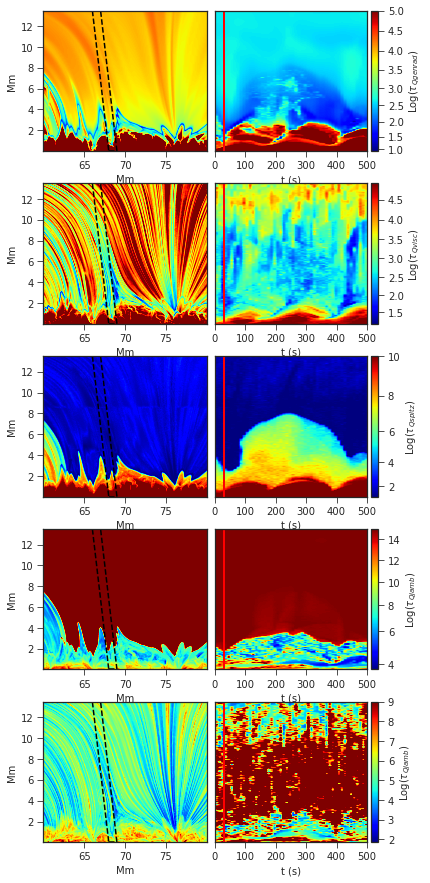

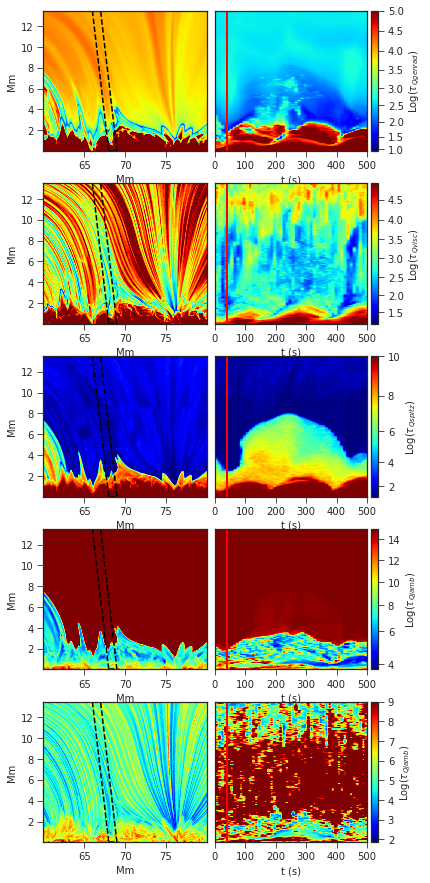

...

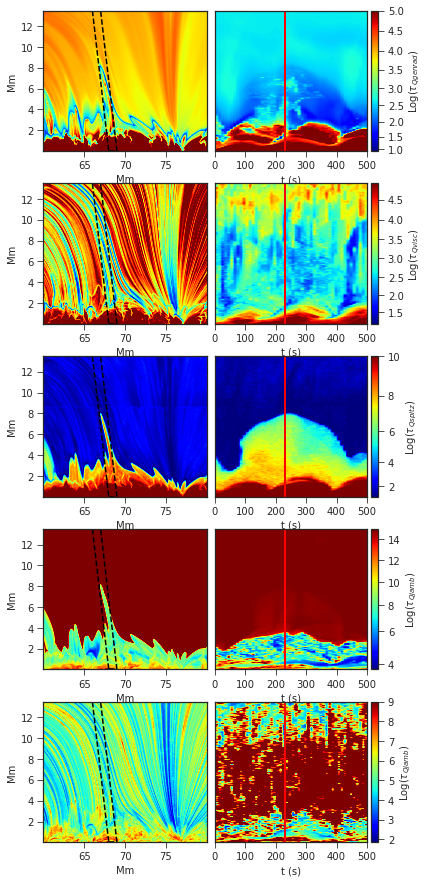

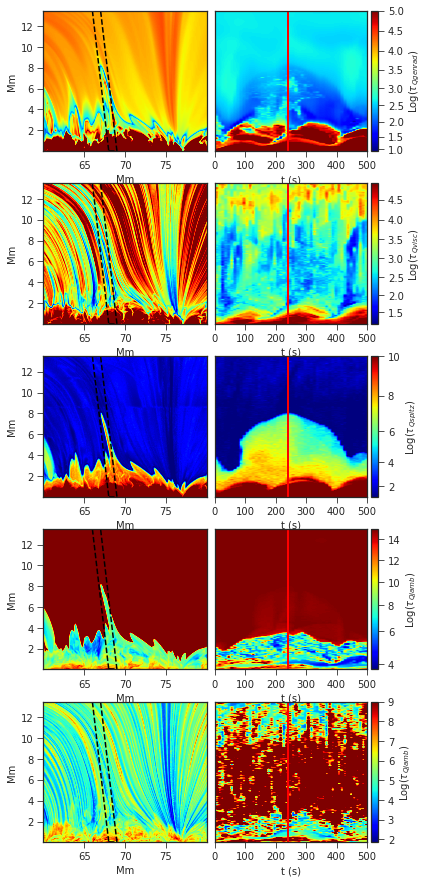

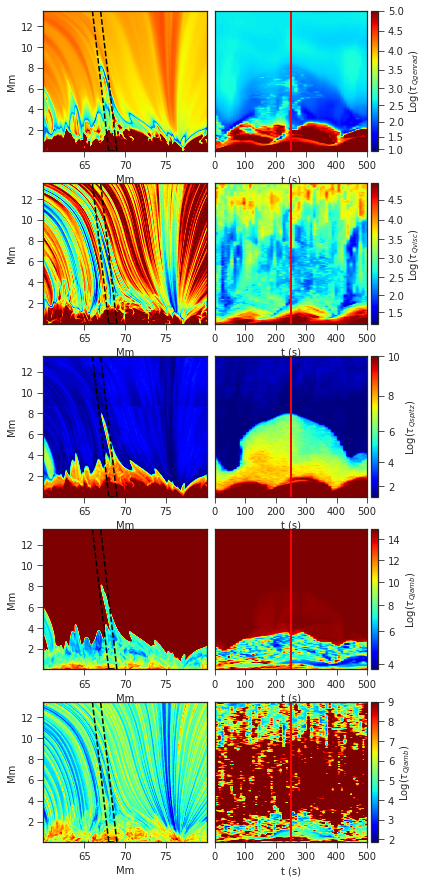

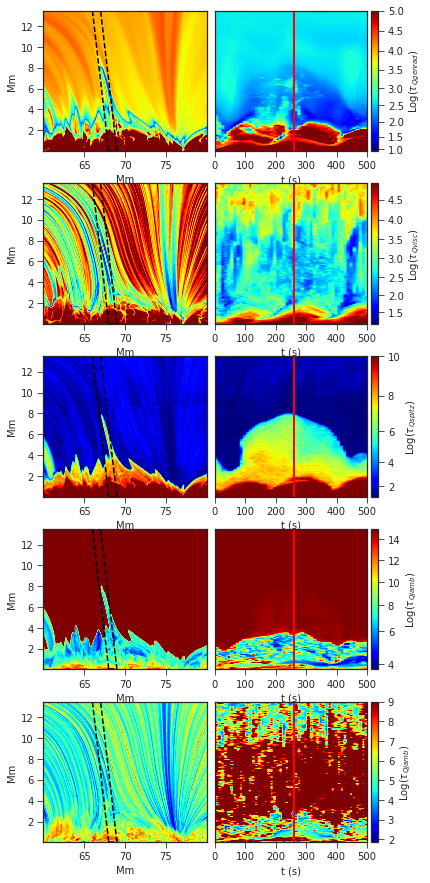

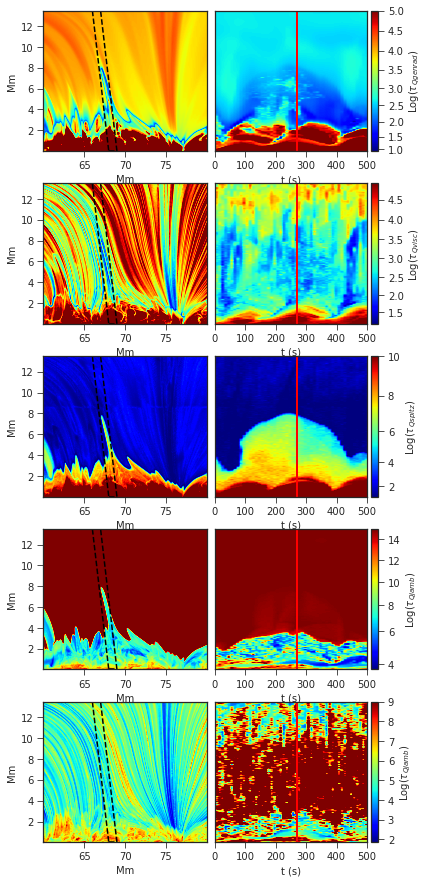

In [ ]:
plt.style.use('seaborn-ticks')
for scan in tqdm(range(50)):
#     scan=scan+14
    fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(6,15.3))
    fig.subplots_adjust(hspace = 0.23,wspace=0.05)
    axs=axs.ravel()
    axs[0].imshow(np.log10(np.abs(tau_genrad[:,:,scan].T)),cmap='jet',vmax=5,aspect='auto',norm=colors.PowerNorm(gamma=1.2),extent=[x_extent[0],x_extent[-1],z1[1410],z1[500]])
    axs[0].set_xlabel('Mm')
    axs[0].set_ylabel('Mm')
    axs[0].plot(x_values1, y_values1,linestyle='--',color='black')
    axs[0].plot(x_values2, y_values2,linestyle='--',color='black')
    axs[0].plot(x_values3, y_values3,linestyle='--',color='black')
    axs[0].plot(x_values4, y_values4,linestyle='--',color='black')

    im3=axs[1].imshow(np.log10(tau_qgenrad_xt_slit),aspect='auto',cmap='jet',vmax=5,norm=colors.PowerNorm(gamma=1.2),extent=[x2[0],x2[50],z1[1410],z1[500]])
    axs[1].set_yticks([])
    divider = make_axes_locatable(axs[1])
    cax3 = divider.append_axes("right", size="5%", pad=0.05)
    cbar=plt.colorbar(im3,cax=cax3)
    cbar.set_label(r'Log($\tau$$_{Qgenrad}$)')
    axs[1].set_xlabel(r't (s)')
    #axs[3].set_title('Space-time map')
    axs[1].axvline(x=x2[scan],color='red',linestyle='-',linewidth=2)

    axs[2].imshow(np.log10(np.abs(tau_visc[:,:,scan].T)),cmap='jet',vmax=4.9,vmin=1.1,norm=colors.PowerNorm(gamma=1.1),aspect='auto',extent=[x_extent[0],x_extent[-1],z1[1410],z1[500]])
    axs[2].set_xlabel('Mm')
    axs[2].set_ylabel('Mm')
    axs[2].plot(x_values1, y_values1,linestyle='--',color='black')
    axs[2].plot(x_values2, y_values2,linestyle='--',color='black')
    axs[2].plot(x_values3, y_values3,linestyle='--',color='black')
    axs[2].plot(x_values4, y_values4,linestyle='--',color='black')

    im3=axs[3].imshow(np.log10(tau_qvisc_xt_slit),aspect='auto',cmap='jet',vmax=4.9,vmin=1.1,norm=colors.PowerNorm(gamma=1.1),extent=[x2[0],x2[50],z1[1410],z1[500]])
    axs[3].set_yticks([])
    divider = make_axes_locatable(axs[3])
    cax3 = divider.append_axes("right", size="5%", pad=0.05)
    cbar=plt.colorbar(im3,cax=cax3)
    cbar.set_label(r'Log($\tau$$_{Qvisc}$)')
    axs[3].set_xlabel(r't (s)')
    #axs[3].set_title('Space-time map')
    axs[3].axvline(x=x2[scan],color='red',linestyle='-',linewidth=2)

    axs[4].imshow(np.log10(np.abs(tau_spitz[:,:,scan].T)/10.),cmap='jet',vmax=10,vmin=0.5,norm=colors.PowerNorm(gamma=1.4),aspect='auto',extent=[x_extent[0],x_extent[-1],z1[1410],z1[500]])
    axs[4].set_xlabel('Mm')
    axs[4].set_ylabel('Mm')
    axs[4].plot(x_values1, y_values1,linestyle='--',color='black')
    axs[4].plot(x_values2, y_values2,linestyle='--',color='black')
    axs[4].plot(x_values3, y_values3,linestyle='--',color='black')
    axs[4].plot(x_values4, y_values4,linestyle='--',color='black')

    im3=axs[5].imshow(np.log10(tau_qspitz_xt_slit/10),aspect='auto',cmap='jet',vmax=10,vmin=0.5,norm=colors.PowerNorm(gamma=1.4),extent=[x2[0],x2[50],z1[1410],z1[500]])
    axs[5].set_yticks([])
    divider = make_axes_locatable(axs[5])
    cax3 = divider.append_axes("right", size="5%", pad=0.05)
    cbar=plt.colorbar(im3,cax=cax3)
    cbar.set_label(r'Log($\tau$$_{Qspitz}$)')
    axs[5].set_xlabel(r't (s)')
    #axs[3].set_title('Space-time map')
    axs[5].axvline(x=x2[scan],color='red',linestyle='-',linewidth=2)

    axs[6].imshow(np.log10(np.abs(tau_qjamb[:,:,scan].T)),cmap='jet',norm=colors.PowerNorm(gamma=0.8),vmax=15,aspect='auto',extent=[x_extent[0],x_extent[-1],z1[1410],z1[500]])
    axs[6].set_xlabel('Mm')
    axs[6].set_ylabel('Mm')
    axs[6].plot(x_values1, y_values1,linestyle='--',color='black')
    axs[6].plot(x_values2, y_values2,linestyle='--',color='black')
    axs[6].plot(x_values3, y_values3,linestyle='--',color='black')
    axs[6].plot(x_values4, y_values4,linestyle='--',color='black')


    im3=axs[7].imshow(np.log10(tau_qjamb_xt_slit),aspect='auto',cmap='jet',norm=colors.PowerNorm(gamma=0.8),vmax=15,extent=[x2[0],x2[50],z1[1410],z1[500]])
    axs[7].set_yticks([])
    divider = make_axes_locatable(axs[7])
    cax3 = divider.append_axes("right", size="5%", pad=0.05)
    cbar=plt.colorbar(im3,cax=cax3)
    cbar.set_label(r'Log($\tau$$_{Qjamb}$)')
    axs[7].set_xlabel(r't (s)')
    #axs[3].set_title('Space-time map')
    axs[7].axvline(x=x2[scan],color='red',linestyle='-',linewidth=2)

    axs[8].imshow(np.log10(np.abs(tau_qjoule[:,:,scan].T)),cmap='jet',norm=colors.PowerNorm(gamma=1.),vmax=9,aspect='auto',extent=[x_extent[0],x_extent[-1],z1[1410],z1[500]])
    axs[8].set_xlabel('Mm')
    axs[8].set_ylabel('Mm')
    axs[8].plot(x_values1, y_values1,linestyle='--',color='black')
    axs[8].plot(x_values2, y_values2,linestyle='--',color='black')
    axs[8].plot(x_values3, y_values3,linestyle='--',color='black')
    axs[8].plot(x_values4, y_values4,linestyle='--',color='black')

    im3=axs[9].imshow(np.log10(tau_qjoule_xt_slit),aspect='auto',cmap='jet',norm=colors.PowerNorm(gamma=1.),vmax=9,extent=[x2[0],x2[50],z1[1410],z1[500]])
    axs[9].set_yticks([])
    divider = make_axes_locatable(axs[9])
    cax3 = divider.append_axes("right", size="5%", pad=0.05)
    cbar=plt.colorbar(im3,cax=cax3)
    cbar.set_label(r'Log($\tau$$_{Qjamb}$)')
    axs[9].set_xlabel(r't (s)')
    #axs[3].set_title('Space-time map')
    axs[9].axvline(x=x2[scan],color='red',linestyle='-',linewidth=2)

    plt.savefig('/mn/stornext/d9/souvikb/High_impact/Juan_simulation/tau_heat-'+str(scan)+'.png',dpi=300,orientation='landscape',bbox_inches = 'tight',pad_innches=0.1)



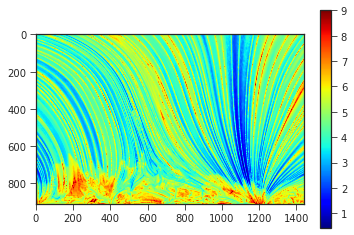

In [195]:
plt.imshow(np.log10(np.abs(tau_qjoule[:,:,30].T)),cmap='jet',vmax=9)
plt.colorbar()

<ipython-input-192-8a7f8ea3095a>:1: RuntimeWarning: divide by zero encountered in log10
  plt.imshow(np.log10(np.abs(roi_spicule_Qjoule_tau[:,:,37].T)),cmap='jet',vmax=9)


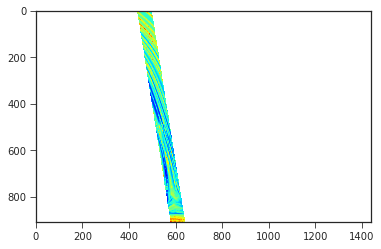

In [192]:
plt.imshow(np.log10(np.abs(roi_spicule_Qjoule_tau[:,:,37].T)),cmap='jet',vmax=9)